##Setting Up The YOLOv5 Environment

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone yolov5 repo into colab environment
!pip install -U -r yolov5/requirements.txt  # install yolov5 dependencies in colab environment



Cloning into 'yolov5'...
remote: Enumerating objects: 6123, done.
remote: Counting objects: 100% (143/143), done.
remote: Compressing objects: 100% (82/82), done.
remote: Total 6123 (delta 82), reused 96 (delta 61), pack-reused 5980
Receiving objects: 100% (6123/6123), 8.72 MiB | 33.97 MiB/s, done.
Resolving deltas: 100% (4171/4171), done.
     |████████████████████████████████| 10.3MB 22.8MB/s 
     |████████████████████████████████| 15.3MB 219kB/s 
     |████████████████████████████████| 50.4MB 62kB/s 
     |████████████████████████████████| 3.0MB 52.4MB/s 
     |████████████████████████████████| 645kB 47.7MB/s 
     |████████████████████████████████| 27.4MB 113kB/s 
Requirement already up-to-date: torch>=1.7.0 in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 10)) (1.8.1+cu101)
Requirement already up-to-date: torchvision>=0.8.1 in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 11)) (0.9.1+cu101)
     |████████████████████

In [2]:
# go to yolov5 folder
%cd /content

/content


In [3]:
import torch
from IPython.display import Image  # for displaying images

## Downloading the data

In [4]:
# Download the dataset from roboflow, unzip it, and delete zip file in the end
!curl -L "https://public.roboflow.com/ds/SaO9K7M48p?key=Z1KXri10ZT"  > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1478      0 --:--:-- --:--:-- --:--:--  1476
100 66.9M  100 66.9M    0     0  44.2M      0  0:00:01  0:00:01 --:--:--  286M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg  
 extracting: test/images/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg  
 extracting: test/images/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg  
 extracting: test/images/IMG_2347_jpeg_jpg.rf.7c71ac4b9301eb358cd4a832844dedcb.jpg  
 extracting: test/images/IMG_2354_jpeg_jpg.rf.396e872c7fb0a95e911806986995ee7a.jpg  
 extracting: test/images/IMG_2371_jpeg_jpg.rf.54505f60b6706da151c164188c30584

The train and test dataset are now inside the yolov5 folder

## Define Model Configuration and Architecture

In [5]:
# check the data.yaml file, to see the train/test folders and the different classes
%cat data.yaml


train: ../train/images
val: ../valid/images

nc: 7
names: ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']

In [ ]:
#check the yolov5s.yaml file to see the model configuration
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [6]:
# we can see, that the model expects 80 different classes (nc). This needs to be changed in order to be compatible with our dataset.
# We open the file and change the value to 7, and check if it worked:
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 7  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3

## Train Custom YOLOv5 Detector

### Next, we'll fire off training!¶
Here, we are able to pass a number of arguments:

* **img:** define input image size
* **batch:** determine batch size
* **epochs:** define the number of training epochs. 
* **data:** set the path to our yaml file
* **cfg:** specify our model configuration
* **weights:** specify a custom path to weights. 
* **name:** result names
* **nosave:** only save the final checkpoint
* **cache:** cache images for faster training





In [7]:
import os
os.chdir('/content/yolov5') #change working directory

In [9]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 80 --epochs 300 --data '../data.yaml' --cfg ./models/yolov5s.yaml --weights ''

/content
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-59-g31ee54c torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=80, bbox_interval=-1, bucket='', cache_images=False, cfg='./models/yolov5s.yaml', data='../data.yaml', device='', entity=None, epochs=300, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=80, upload_dataset=False, weights='', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2021-05-02 15:50:43.435120: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successf

In [ ]:
## Show training-progress with tensoboard
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs

Training Data:


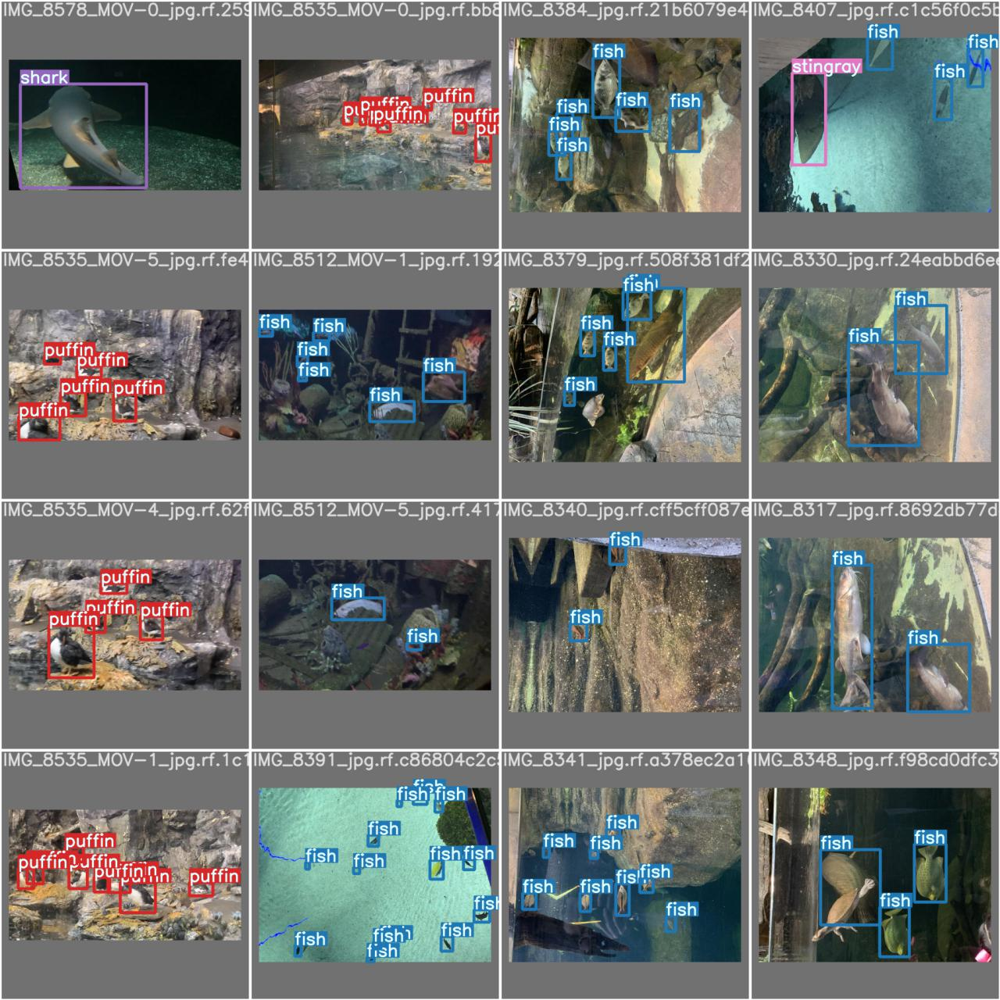

In [15]:
# Display Training Data
print("Training Data:")
Image(filename='/content/yolov5/runs/train/exp/test_batch0_labels.jpg', width=900)

# Inference
Run Inference on test set

In [16]:
# for inferece, we can use the weights stored as best.pt
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/exp/weights/best.pt'])
YOLOv5 🚀 v5.0-59-g31ee54c torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7070092 parameters, 0 gradients, 16.4 GFLOPS
image 1/63 /content/yolov5/../test/images/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg: 416x320 1 puffin, Done. (0.009s)
image 2/63 /content/yolov5/../test/images/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg: 416x320 9 penguins, Done. (0.009s)
image 3/63 /content/yolov5/../test/images/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg: 416x320 5 penguins, Done. (0.008s)
image 4/63 /content/

### Output

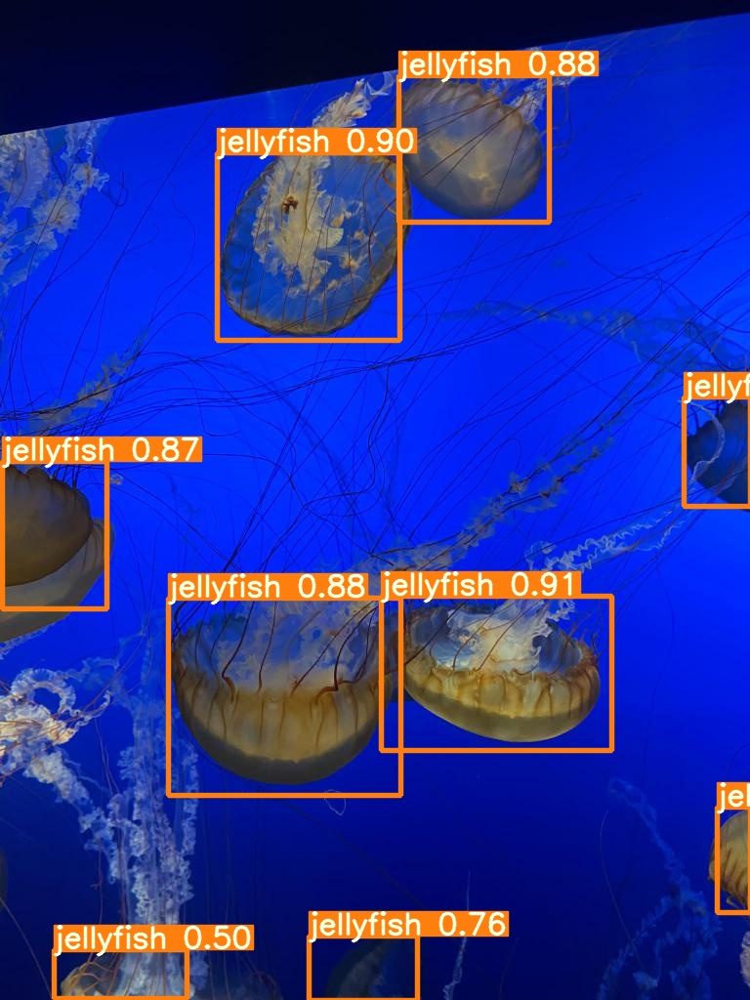

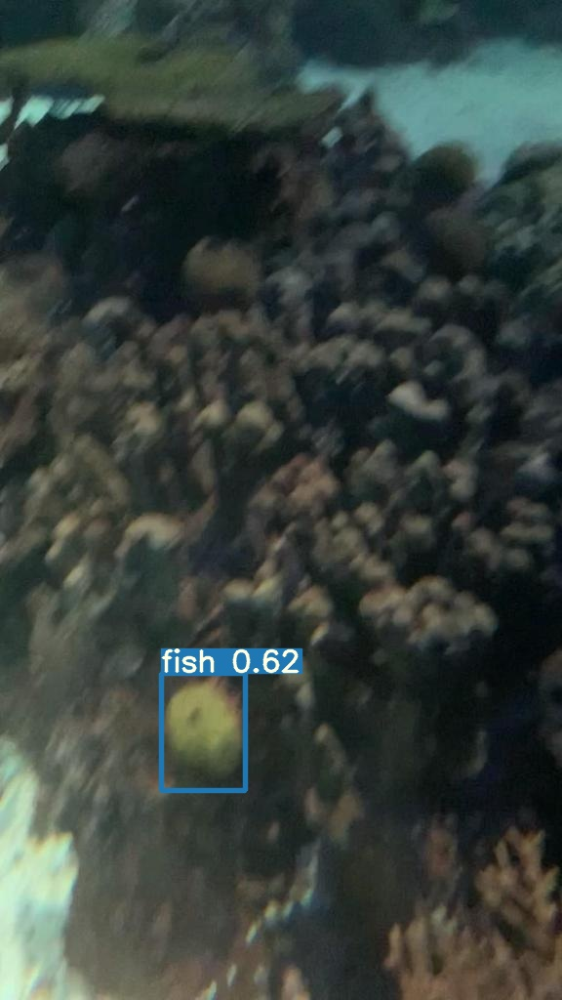

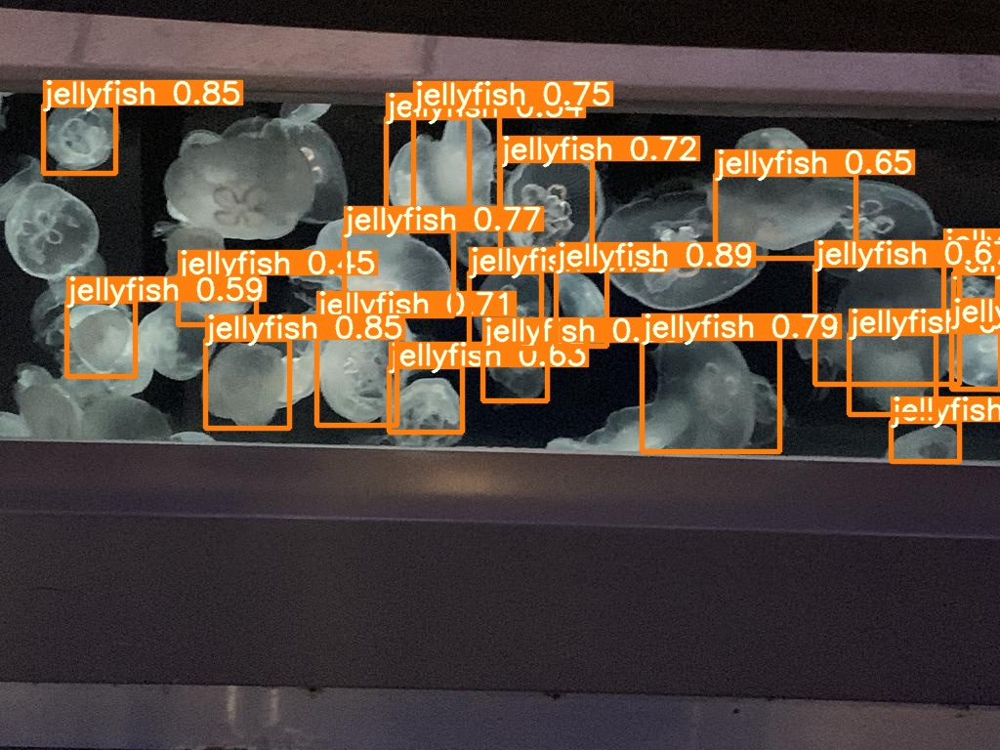

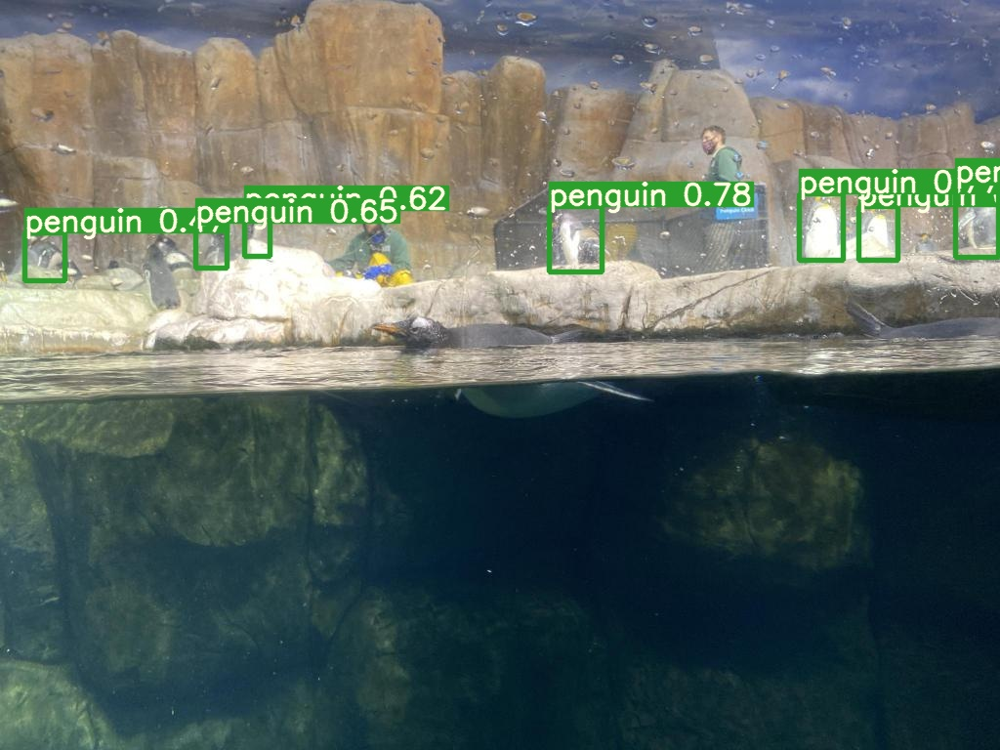

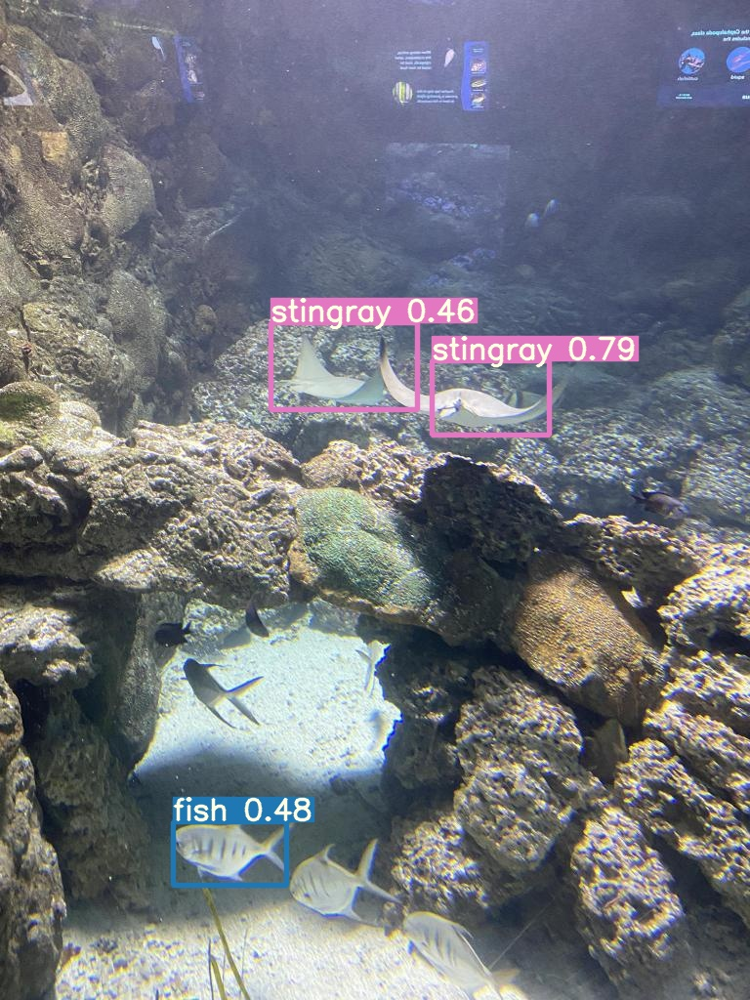

...

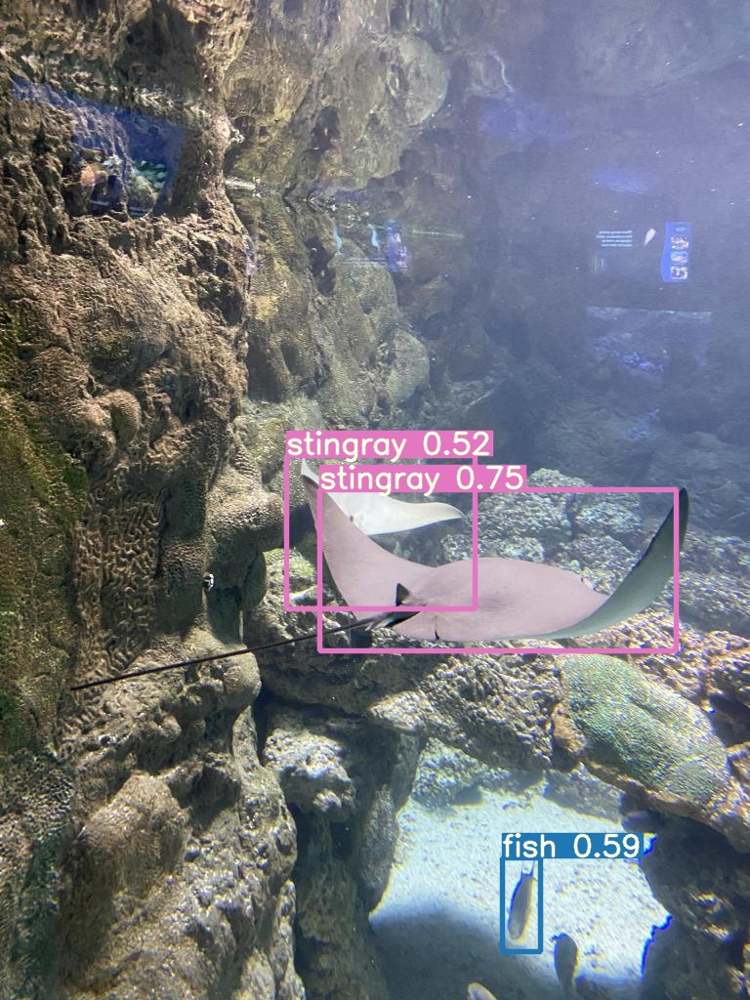

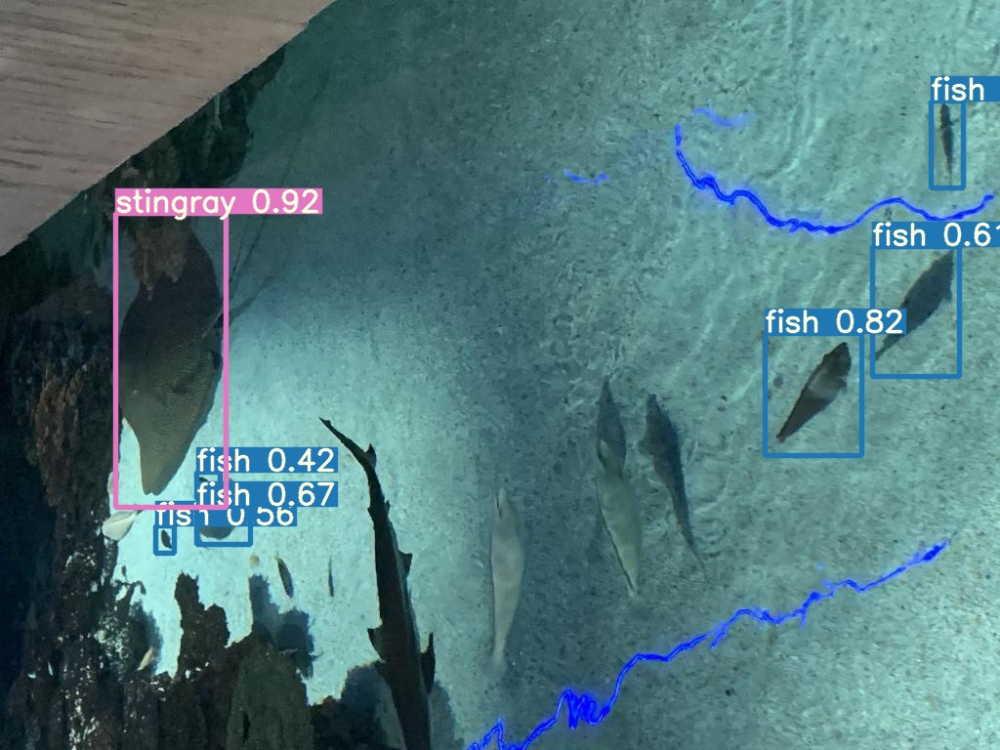

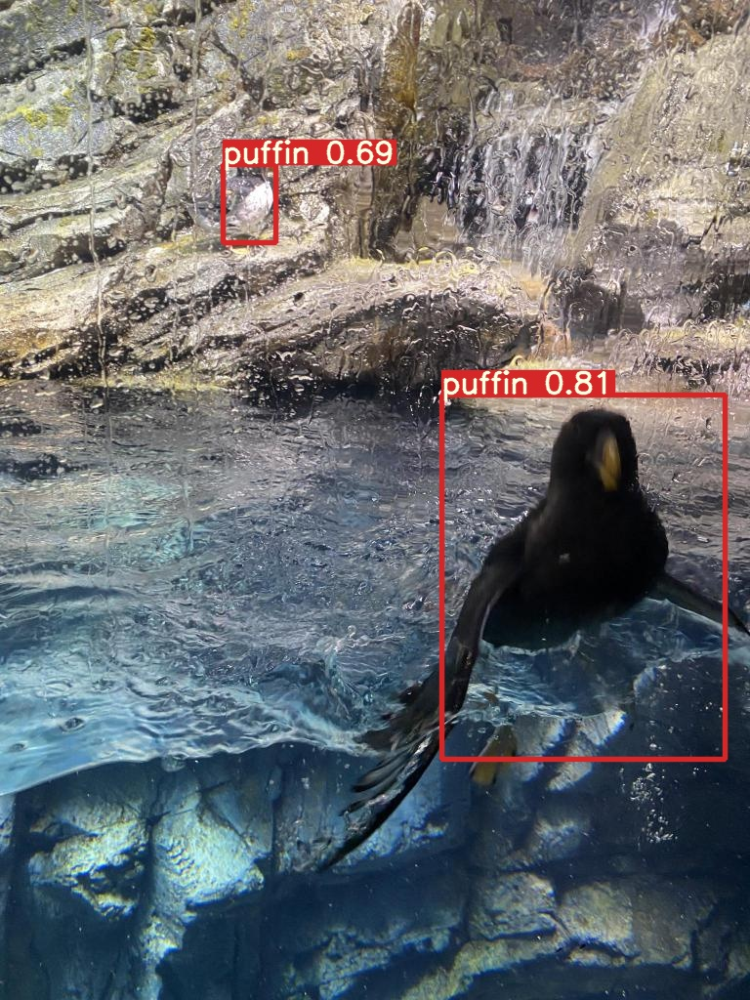

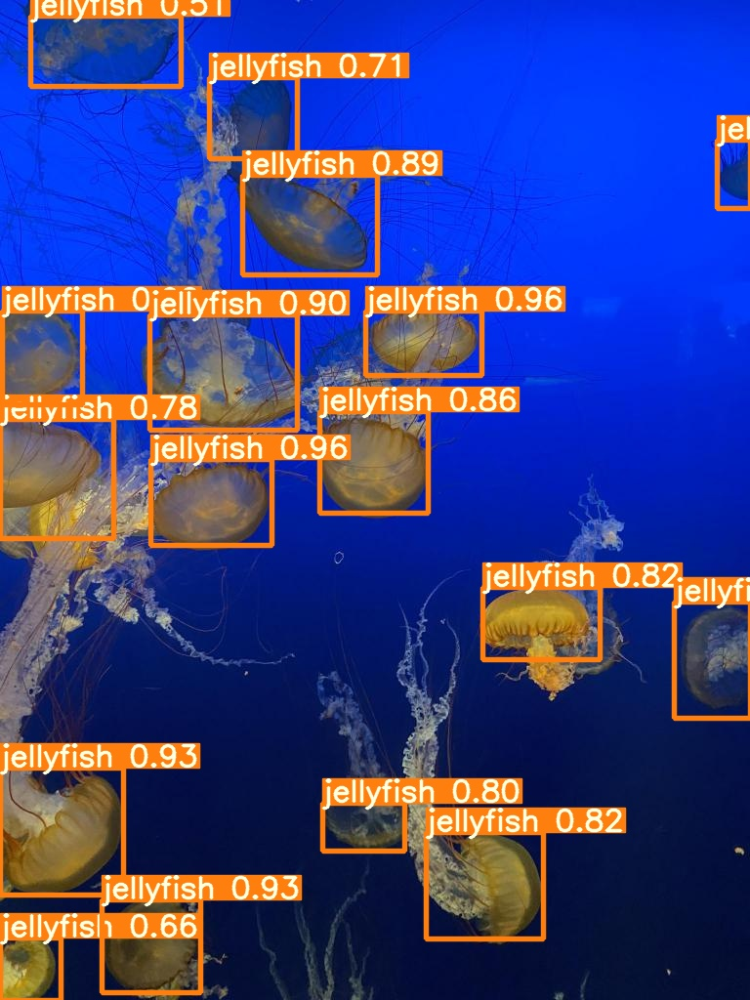

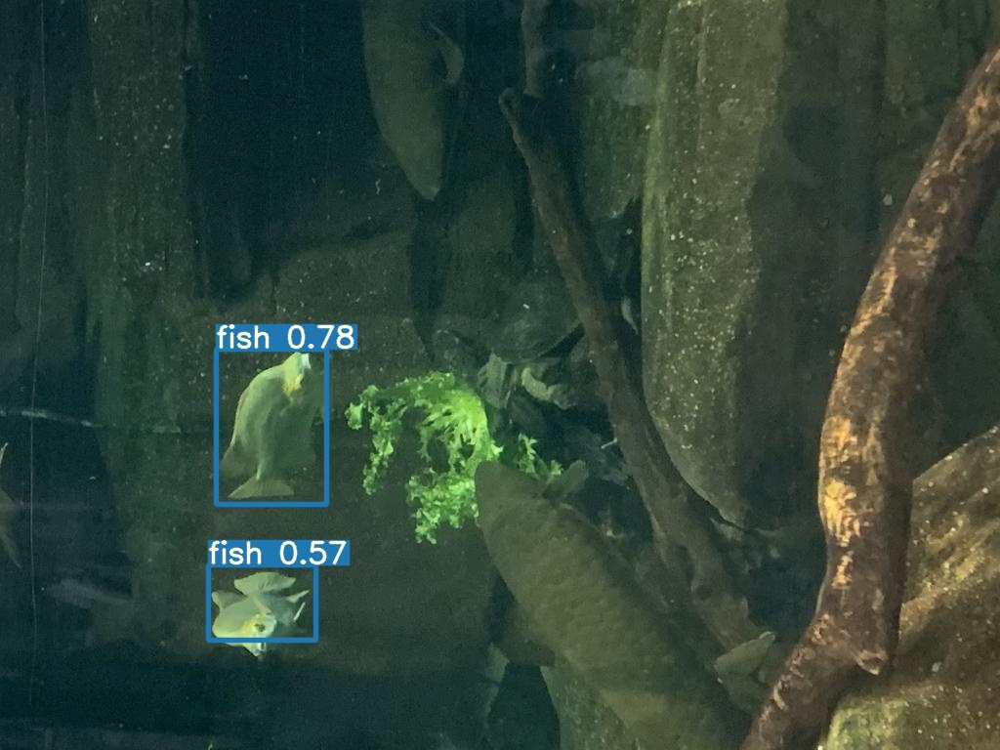

In [17]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

## Export weights
to automatically export the best.py weights for future inference, we mount gDrive and copy the file over.

In [18]:
from google.colab import drive
drive.mount('/content/gdrive')

%cp /content/yolov5/runs/train/exp/weights/best.pt /content/gdrive/My\ Drive

Mounted at /content/gdrive
